In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')
import seaborn as sns
pd.set_option('display.max_columns', None)
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from src.data_funcs import *
from src.model_funcs import *
from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors


In [2]:
anime_df = pd.read_csv('data/anime.csv')
rating_df = pd.read_csv('data/rating.csv')
anime_meta = pd.read_csv('data/AnimeList_meta.csv')
users_meta = pd.read_csv('data/UserList_Meta.csv')

## EDA of Ratings Data

In [3]:
rating_df = rating_df[rating_df['rating']!= -1]
rating_df
#removing the -1 because that indicated no ratings

,user_id,anime_id,rating
47,1,8074,10
81,1,11617,10
83,1,11757,10
101,1,15451,10
153,2,11771,10
...,...,...,...
7813732,73515,16512,7
7813733,73515,17187,9
7813734,73515,22145,10
7813735,73516,790,9


In [4]:
user_grp = rating_df.groupby('user_id').count()['rating']
item_grp = rating_df.groupby('anime_id').count()['rating']
user_grp

user_id
1          4
2          1
3         92
5        459
7        343
        ... 
73512     12
73513     33
73514      1
73515    179
73516      2
Name: rating, Length: 69600, dtype: int64

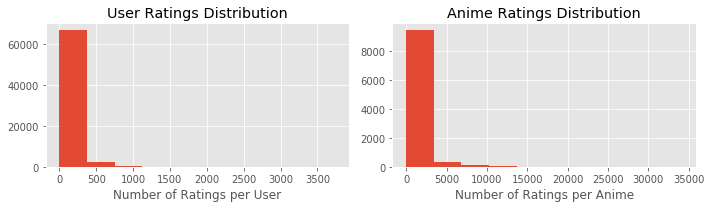

In [5]:
fig, ax = plt.subplots(1,2, figsize=(10,3))
ax[0].hist(user_grp)
ax[0].set_title('User Ratings Distribution')
ax[0].set_xlabel('Number of Ratings per User')
ax[1].hist(item_grp)
ax[1].set_title('Anime Ratings Distribution')
ax[1].set_xlabel('Number of Ratings per Anime')
plt.tight_layout()
# plt.savefig('images/rating_count_dist.png',dpi=300)


plt.show()

In [6]:
print(f'Avg Ratings Given per user {user_grp.mean()}, Median: {user_grp.median()} \n')
print(f'Avg Ratings received per movie {item_grp.mean()}, Median: {item_grp.median()}')

Avg Ratings Given per user 91.05231321839081, Median: 45.0 

Avg Ratings received per movie 638.3843054296364, Median: 57.0


In [7]:
users_over_thresh = user_grp[user_grp>300].index
len(users_over_thresh)

4326

In [8]:
anime_over_thresh = item_grp[item_grp>2500].index
len(anime_over_thresh)

694

## Simple Collaborative Filtering with correlation between user ratings

In [9]:
#Only take the users & anime over the thresholds
reduced_df = rating_df[(rating_df['user_id'].isin(users_over_thresh)) & (rating_df['anime_id'].isin(anime_over_thresh))]
reduced_df

,user_id,anime_id,rating
302,5,6,8
306,5,20,6
308,5,24,1
309,5,30,1
310,5,45,7
...,...,...,...
7812686,73502,17247,9
7812688,73502,17549,9
7812697,73502,18247,4
7812700,73502,19221,6


In [112]:
ratings_pivot = pd.pivot_table(data=reduced_df, values='rating', index='anime_id',columns='user_id')
ratings_pivot.head()

user_id   5      7      17     46     123    160    210    226    248    \
anime_id                                                                  
1           NaN    NaN    NaN   10.0    NaN    9.0   10.0    8.0    NaN   
5           NaN    NaN    NaN    NaN    NaN    9.0    NaN    NaN    NaN   
6           8.0    NaN    7.0    NaN    NaN    7.0    NaN    8.0    NaN   
16          NaN    NaN    NaN    NaN    9.0    9.0    9.0    NaN    NaN   
19          NaN    NaN   10.0    NaN    NaN    9.0    NaN    NaN    NaN   

user_id   256    271    294    321    392    395    438    446    455    \
anime_id                                                                  
1           NaN    NaN    7.0    NaN    7.0    NaN    NaN    9.0    NaN   
5           NaN    NaN    7.0    NaN    NaN    NaN    NaN    8.0    NaN   
6           NaN    NaN    NaN    NaN    7.0    NaN    NaN    9.0    NaN   
16          NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    8.0   
19          NaN    NaN    NaN    NaN    NaN    NaN    NaN   10.0    NaN   

user_id   460    462    478    492    497    511    530    540    541    \
anime_id                                                                  
1           8.0    NaN    NaN    9.0    9.0    NaN    8.0    NaN    8.0   
5           NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
6           8.0    NaN    NaN    5.0    7.0    NaN    NaN    NaN    9.0   
16          NaN    NaN    8.0    NaN    NaN    NaN    NaN    NaN    NaN   
19          NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

user_id   553    565    567    634    661    670    721    741    768    \
anime_id                                                                  
1           NaN    5.0    8.0   10.0    NaN    NaN    NaN   10.0    NaN   
5           NaN    5.0    NaN    9.0    NaN    NaN    NaN    NaN    NaN   
6           NaN    6.0   10.0    NaN    NaN    7.0    NaN    NaN    NaN   
16          NaN    5.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
19          NaN    5.0    NaN    NaN    9.0    NaN    NaN    NaN    NaN   

user_id   771    784    786    813    814    861    943    946    954    \
anime_id                                                                  
1           8.0    8.0    NaN    9.0   10.0    9.0    9.0    9.0    NaN   
5           7.0    NaN    NaN    NaN    8.0   10.0    NaN    9.0    NaN   
6           8.0    7.0    NaN    NaN    NaN    8.0    9.0    8.0    NaN   
16          7.0    NaN    NaN    8.0    9.0    NaN    NaN    7.0    NaN   
19          8.0    NaN    NaN    9.0   10.0    9.0    NaN    8.0    NaN   

user_id   958    1019   1020   1044   1058   1103   1116   1132   1140   \
anime_id                                                                  
1          10.0    NaN    NaN    NaN    NaN    9.0    NaN    NaN    NaN   
5          10.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
6           NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
16          NaN    NaN    NaN    NaN    NaN    8.0    NaN    NaN    NaN   
19         10.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN    5.0   

user_id   1145   1176   1191   1222   1223   1237   1287   1324   1327   \
anime_id                                                                  
1           NaN    9.0    8.0    NaN    NaN    9.0    NaN    9.0    NaN   
5           NaN    NaN    NaN    NaN    NaN    9.0    NaN    NaN    NaN   
6           8.0    NaN    8.0    NaN    NaN   10.0    NaN    NaN    NaN   
16          8.0    NaN    NaN   10.0    NaN    7.0    NaN    NaN    NaN   
19          NaN    8.0    NaN    NaN    NaN    8.0    NaN    NaN    NaN   

user_id   1344   1396   1419   1450   1456   1497   1501   1504   1522   \
anime_id                                                                  
1           8.0    9.0    NaN    8.0    NaN    NaN    NaN    NaN    NaN   
5           NaN    9.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
6           9.0   

## Simple KNN

In [117]:
rating_test = rating_pivot(anime_full, rating_df, method='zero')
rating_test

user_id   5      7      17     46     123    160    210    226    248    \
anime_id                                                                  
1           0.0    0.0    0.0   10.0    0.0    9.0   10.0    8.0    0.0   
5           0.0    0.0    0.0    0.0    0.0    9.0    0.0    0.0    0.0   
6           8.0    0.0    7.0    0.0    0.0    7.0    0.0    8.0    0.0   
16          0.0    0.0    0.0    0.0    9.0    9.0    9.0    0.0    0.0   
19          0.0    0.0   10.0    0.0    0.0    9.0    0.0    0.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    0.0    6.0    0.0    8.0    0.0    0.0    0.0    0.0   
31859       0.0    7.0    0.0    0.0    7.0    0.0    9.0    7.0    0.0   
31964       0.0    0.0    8.0    9.0    9.0    0.0    9.0    0.0    0.0   
32182       9.0    0.0    9.0    8.0    9.0    0.0    0.0    8.0    0.0   
32282       0.0    0.0    8.0    8.0    0.0    0.0    8.0    0.0    0.0   

user_id   256    271    294    321    392    395    438    446    455    \
anime_id                                                                  
1           0.0    0.0    7.0    0.0    7.0    0.0    0.0    9.0    0.0   
5           0.0    0.0    7.0    0.0    0.0    0.0    0.0    8.0    0.0   
6           0.0    0.0    0.0    0.0    7.0    0.0    0.0    9.0    0.0   
16          0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    8.0   
19          0.0    0.0    0.0    0.0    0.0    0.0    0.0   10.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    9.0    0.0    8.0    5.0    0.0    0.0    8.0    0.0   
31859       9.0    0.0    0.0    0.0    5.0    0.0    0.0    8.0    0.0   
31964      10.0   10.0    0.0    9.0    7.0    0.0    0.0    8.0    0.0   
32182       0.0    9.0    0.0    0.0    6.0    0.0    0.0    7.0    0.0   
32282       0.0    0.0    0.0    0.0    8.0    0.0    0.0    8.0    0.0   

user_id   460    462    478    492    497    511    530    540    541    \
anime_id                                                                  
1           8.0    0.0    0.0    9.0    9.0    0.0    8.0    0.0    8.0   
5           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
6           8.0    0.0    0.0    5.0    7.0    0.0    0.0    0.0    9.0   
16          0.0    0.0    8.0    0.0    0.0    0.0    0.0    0.0    0.0   
19          0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    7.0    9.0    0.0    0.0    0.0    7.0    0.0    0.0   
31859       0.0    7.0    0.0    8.0    0.0    0.0    0.0    7.0    0.0   
31964       0.0    0.0    0.0    8.0   10.0    0.0    8.0    8.0    0.0   
32182       0.0    0.0    0.0    8.0    0.0    0.0    0.0    0.0    0.0   
32282       0.0    0.0    0.0    9.0    0.0    0.0    0.0    0.0    0.0   

user_id   553    565    567    634    661    670    721    741    768    \
anime_id                                                                  
1           0.0    5.0    8.0   10.0    0.0    0.0    0.0   10.0    0.0   
5           0.0    5.0    0.0    9.0    0.0    0.0    0.0    0.0    0.0   
6           0.0    6.0   10.0    0.0    0.0    7.0    0.0    0.0    0.0   
16          0.0    5.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
19          0.0    5.0    0.0    0.0    9.0    0.0    0.0    0.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    9.0   
31859       0.0    6.0    0.0    0.0    0.0    9.0    0.0    0.0    8.0   
31964       0.0    0.0    0.0    8.0    0.0   10.0    0.0    0.0    9.0   
32182       0.0    0.0   10.0    8.0    0.0    0.0    0.0    0.0    9.0   
32282       0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   10.0   

user_id   771    784    786    813    814    861    943    946    954    \
anime_id             

In [113]:
ratings_pivot1 = ratings_pivot.copy().fillna(0)
ratings_pivot1

user_id   5      7      17     46     123    160    210    226    248    \
anime_id                                                                  
1           0.0    0.0    0.0   10.0    0.0    9.0   10.0    8.0    0.0   
5           0.0    0.0    0.0    0.0    0.0    9.0    0.0    0.0    0.0   
6           8.0    0.0    7.0    0.0    0.0    7.0    0.0    8.0    0.0   
16          0.0    0.0    0.0    0.0    9.0    9.0    9.0    0.0    0.0   
19          0.0    0.0   10.0    0.0    0.0    9.0    0.0    0.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    0.0    6.0    0.0    8.0    0.0    0.0    0.0    0.0   
31859       0.0    7.0    0.0    0.0    7.0    0.0    9.0    7.0    0.0   
31964       0.0    0.0    8.0    9.0    9.0    0.0    9.0    0.0    0.0   
32182       9.0    0.0    9.0    8.0    9.0    0.0    0.0    8.0    0.0   
32282       0.0    0.0    8.0    8.0    0.0    0.0    8.0    0.0    0.0   

user_id   256    271    294    321    392    395    438    446    455    \
anime_id                                                                  
1           0.0    0.0    7.0    0.0    7.0    0.0    0.0    9.0    0.0   
5           0.0    0.0    7.0    0.0    0.0    0.0    0.0    8.0    0.0   
6           0.0    0.0    0.0    0.0    7.0    0.0    0.0    9.0    0.0   
16          0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    8.0   
19          0.0    0.0    0.0    0.0    0.0    0.0    0.0   10.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    9.0    0.0    8.0    5.0    0.0    0.0    8.0    0.0   
31859       9.0    0.0    0.0    0.0    5.0    0.0    0.0    8.0    0.0   
31964      10.0   10.0    0.0    9.0    7.0    0.0    0.0    8.0    0.0   
32182       0.0    9.0    0.0    0.0    6.0    0.0    0.0    7.0    0.0   
32282       0.0    0.0    0.0    0.0    8.0    0.0    0.0    8.0    0.0   

user_id   460    462    478    492    497    511    530    540    541    \
anime_id                                                                  
1           8.0    0.0    0.0    9.0    9.0    0.0    8.0    0.0    8.0   
5           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
6           8.0    0.0    0.0    5.0    7.0    0.0    0.0    0.0    9.0   
16          0.0    0.0    8.0    0.0    0.0    0.0    0.0    0.0    0.0   
19          0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    7.0    9.0    0.0    0.0    0.0    7.0    0.0    0.0   
31859       0.0    7.0    0.0    8.0    0.0    0.0    0.0    7.0    0.0   
31964       0.0    0.0    0.0    8.0   10.0    0.0    8.0    8.0    0.0   
32182       0.0    0.0    0.0    8.0    0.0    0.0    0.0    0.0    0.0   
32282       0.0    0.0    0.0    9.0    0.0    0.0    0.0    0.0    0.0   

user_id   553    565    567    634    661    670    721    741    768    \
anime_id                                                                  
1           0.0    5.0    8.0   10.0    0.0    0.0    0.0   10.0    0.0   
5           0.0    5.0    0.0    9.0    0.0    0.0    0.0    0.0    0.0   
6           0.0    6.0   10.0    0.0    0.0    7.0    0.0    0.0    0.0   
16          0.0    5.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
19          0.0    5.0    0.0    0.0    9.0    0.0    0.0    0.0    0.0   
...         ...    ...    ...    ...    ...    ...    ...    ...    ...   
31798       0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    9.0   
31859       0.0    6.0    0.0    0.0    0.0    9.0    0.0    0.0    8.0   
31964       0.0    0.0    0.0    8.0    0.0   10.0    0.0    0.0    9.0   
32182       0.0    0.0   10.0    8.0    0.0    0.0    0.0    0.0    9.0   
32282       0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   10.0   

user_id   771    784    786    813    814    861    943    946    954    \
anime_id             

In [114]:
ratings_csr = csr_matrix(ratings_pivot1)
ratings_csr

<694x4324 sparse matrix of type '<class 'numpy.float64'>'
	with 1037652 stored elements in Compressed Sparse Row format>

In [115]:
model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn.fit(ratings_csr)

NearestNeighbors(algorithm='brute', leaf_size=30, metric='cosine',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)

In [11]:
anime_full = full_anime_df(rating_df, anime_df, anime_meta)

In [12]:
anime_map = anime_full[['anime_id','name','title_english', 'type']]
anime_map

,anime_id,name,title_english,type
0,32281,Kimi No Na Wa.,Your Name.,Movie
1,5114,Fullmetal Alchemist: Brotherhood,Fullmetal Alchemist: Brotherhood,TV
2,28977,Gintama°,Gintama Season 4,TV
3,9253,Steins;Gate,Steins;Gate,TV
4,9969,Gintama&#039;,Gintama Season 2,TV
...,...,...,...,...
12289,9316,Toushindai My Lover: Minami Tai Mecha-Minami,NaN,OVA
12290,5543,Under World,NaN,OVA
12291,5621,Violence Gekiga David No Hoshi,Beautiful Girl Hunter,OVA
12292,6133,Violence Gekiga Shin David No Hoshi: Inma Dens...,NaN,OVA


In [116]:
anime_id = 120
distances, indices = model_knn.kneighbors(ratings_pivot1.iloc[ratings_pivot1.index==anime_id,:], n_neighbors = 11)

for i in range(0, len(distances.flatten())):
    if i == 0:
        anime_name = anime_map[anime_map['anime_id']==anime_id]['name'].values
        print(f'Recommendations for {anime_id} {anime_name}:\n')
    else:
        idx = ratings_pivot1.index[indices.flatten()[i]]
        print('{0}: {1}, with distance of {2}:'.format(i, anime_map[anime_map['anime_id']==idx]['name'].values, distances.flatten()[i]))


Recommendations for 120 ['Fruits Basket']:

1: ['Ouran Koukou Host Club'], with distance of 0.373222052075192:
2: ['Chobits'], with distance of 0.4624859112856201:
3: ['Fullmetal Alchemist'], with distance of 0.4802540588214821:
4: ['D.N.Angel'], with distance of 0.484765127405153:
5: ['Vampire Knight'], with distance of 0.4859228901227741:
6: ['Sen To Chihiro No Kamikakushi'], with distance of 0.4903165145454421:
7: ['Lovely★Complex'], with distance of 0.4960176951616878:
8: ['Tsubasa Chronicle'], with distance of 0.49802071811742765:
9: ['Suzumiya Haruhi No Yuuutsu'], with distance of 0.49827088077896575:
10: ['Full Metal Panic!'], with distance of 0.4997038875693144:


In [144]:
#Try filling the NaNs with average per movie
ratings_pivot2 = ratings_pivot.copy()
# ratings_pivot2 = ratings_pivot2.fillna(ratings_pivot2.mean(axis=0)) 
columns = ratings_pivot2.columns
print('done')

done


In [145]:
#Fill NaNs with the mean for the user
for col in columns:
    ratings_pivot2[col] = ratings_pivot2[col].fillna((ratings_pivot2[col].mean()))
    
ratings_pivot2

user_id      5         7         17         46        123       160    \
anime_id                                                                
1         4.212355  7.666667   7.37751  10.000000  7.511628  9.000000   
5         4.212355  7.666667   7.37751   8.683938  7.511628  9.000000   
6         8.000000  7.666667   7.00000   8.683938  7.511628  7.000000   
16        4.212355  7.666667   7.37751   8.683938  9.000000  9.000000   
19        4.212355  7.666667  10.00000   8.683938  7.511628  9.000000   
...            ...       ...       ...        ...       ...       ...   
31798     4.212355  7.666667   6.00000   8.683938  8.000000  8.468599   
31859     4.212355  7.000000   7.37751   8.683938  7.000000  8.468599   
31964     4.212355  7.666667   8.00000   9.000000  9.000000  8.468599   
32182     9.000000  7.666667   9.00000   8.000000  9.000000  8.468599   
32282     4.212355  7.666667   8.00000   8.000000  7.511628  8.468599   

user_id      210       226       248        256        271       294    \
anime_id                                                                 
1         10.00000  8.000000  8.324219   8.622549   8.173333  7.000000   
5          8.70229  7.790576  8.324219   8.622549   8.173333  7.000000   
6          8.70229  8.000000  8.324219   8.622549   8.173333  8.267442   
16         9.00000  7.790576  8.324219   8.622549   8.173333  8.267442   
19         8.70229  7.790576  8.324219   8.622549   8.173333  8.267442   
...            ...       ...       ...        ...        ...       ...   
31798      8.70229  7.790576  8.324219   8.622549   9.000000  8.267442   
31859      9.00000  7.000000  8.324219   9.000000   8.173333  8.267442   
31964      9.00000  7.790576  8.324219  10.000000  10.000000  8.267442   
32182      8.70229  8.000000  8.324219   8.622549   9.000000  8.267442   
32282      8.00000  7.790576  8.324219   8.622549   8.173333  8.267442   

user_id      321       392       395       438        446       455    \
anime_id                                                                
1         8.314136  7.000000  7.806452  7.872222   9.000000  7.267677   
5         8.314136  6.350158  7.806452  7.872222   8.000000  7.267677   
6         8.314136  7.000000  7.806452  7.872222   9.000000  7.267677   
16        8.314136  6.350158  7.806452  7.872222   7.757412  8.000000   
19        8.314136  6.350158  7.806452  7.872222  10.000000  7.267677   
...            ...       ...       ...       ...        ...       ...   
31798     8.000000  5.000000  7.806452  7.872222   8.000000  7.267677   
31859     8.314136  5.000000  7.806452  7.872222   8.000000  7.267677   
31964     9.000000  7.000000  7.806452  7.872222   8.000000  7.267677   
32182     8.314136  6.000000  7.806452  7.872222   7.000000  7.267677   
32282     8.314136  8.000000  7.806452  7.872222   8.000000  7.267677   

user_id      460       462       478       492        497       511    \
anime_id                                                                
1         8.000000  8.089655  8.698667  9.000000   9.000000  6.994819   
5         7.409091  8.089655  8.698667  6.929461   7.813665  6.994819   
6         8.000000  8.089655  8.698667  5.000000   7.000000  6.994819   
16        7.409091  8.089655  8.000000  6.929461   7.813665  6.994819   
19        7.409091  8.089655  8.698667  6.929461   7.813665  6.994819   
...            ...       ...       ...       ...        ...       ...   
31798     7.409091  7.000000  9.000000  6.929461   7.813665  6.994819   
31859     7.409091  7.000000  8.698667  8.000000   7.813665  6.994819   
31964     7.409091  8.089655  8.698667  8.000000  10.000000  6.994819   
32182     7.409091  8.089655  8.698667  8.000000   7.813665  6.994819   
32282     7.409091  8.089655  8.698667  9.000000   7.813665  6.994819   

user_id      530       540       541       553       565        567    \
anime_id                                                                
1         8.000000  8.054795  8.000000  8

In [146]:
ratings_csr2 = csr_matrix(ratings_pivot2)

In [148]:
model_knn2 = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn2.fit(ratings_csr2)
anime_id = 120
distances2, indices2 = model_knn2.kneighbors(ratings_pivot2.iloc[ratings_pivot2.index==anime_id,:], n_neighbors = 11)

for i in range(0, len(distances2.flatten())):
    if i == 0:
        anime_name = anime_map[anime_map['anime_id']==anime_id]['name'].values
        print(f'Recommendations for {anime_id} {anime_name}:\n')
    else:
        idx = ratings_pivot2.index[indices2.flatten()[i]]
        print('{0}: {1}, with distance of {2}:'.format(i, anime_map[anime_map['anime_id']==idx]['name'].values, distances.flatten()[i]))


Recommendations for 120 ['Fruits Basket']:

1: ['Sekaiichi Hatsukoi 2'], with distance of 0.373222052075192:
2: ['Junjou Romantica 2'], with distance of 0.4624859112856201:
3: ['Sekaiichi Hatsukoi'], with distance of 0.4802540588214821:
4: ['Cardcaptor Sakura Movie 2: Fuuin Sareta Card'], with distance of 0.484765127405153:
5: ['Paradise Kiss'], with distance of 0.4859228901227741:
6: ['Kuroshitsuji: Book Of Circus'], with distance of 0.4903165145454421:
7: ['Inuyasha: Kanketsu-Hen'], with distance of 0.4960176951616878:
8: ['Inuyasha: Kagami No Naka No Mugenjo'], with distance of 0.49802071811742765:
9: ['Jigoku Shoujo Futakomori'], with distance of 0.49827088077896575:
10: ['Cardcaptor Sakura Movie 1'], with distance of 0.4997038875693144:


In [149]:
#Try to impute the mean of the anime instead
ratings_pivot3 = ratings_pivot.copy()
ratings_pivot3 = ratings_pivot3.T.fillna(ratings_pivot3.mean(axis=1)).T
ratings_pivot3

user_id      5         7          17         46        123       160    \
anime_id                                                                 
1         8.626393  8.626393   8.626393  10.000000  8.626393  9.000000   
5         8.325038  8.325038   8.325038   8.325038  8.325038  9.000000   
6         8.000000  8.224349   7.000000   8.224349  8.224349  7.000000   
16        8.266990  8.266990   8.266990   8.266990  9.000000  9.000000   
19        8.804217  8.804217  10.000000   8.804217  8.804217  9.000000   
...            ...       ...        ...        ...       ...       ...   
31798     7.567723  7.567723   6.000000   7.567723  8.000000  7.567723   
31859     7.951220  7.000000   7.951220   7.951220  7.000000  7.951220   
31964     8.307900  8.307900   8.000000   9.000000  9.000000  8.307900   
32182     9.000000  8.463536   9.000000   8.000000  9.000000  8.463536   
32282     8.393339  8.393339   8.000000   8.000000  8.393339  8.393339   

user_id       210       226       248        256        271       294    \
anime_id                                                                  
1         10.000000  8.000000  8.626393   8.626393   8.626393  7.000000   
5          8.325038  8.325038  8.325038   8.325038   8.325038  7.000000   
6          8.224349  8.000000  8.224349   8.224349   8.224349  8.224349   
16         9.000000  8.266990  8.266990   8.266990   8.266990  8.266990   
19         8.804217  8.804217  8.804217   8.804217   8.804217  8.804217   
...             ...       ...       ...        ...        ...       ...   
31798      7.567723  7.567723  7.567723   7.567723   9.000000  7.567723   
31859      9.000000  7.000000  7.951220   9.000000   7.951220  7.951220   
31964      9.000000  8.307900  8.307900  10.000000  10.000000  8.307900   
32182      8.463536  8.000000  8.463536   8.463536   9.000000  8.463536   
32282      8.000000  8.393339  8.393339   8.393339   8.393339  8.393339   

user_id      321       392       395       438       446       455    \
anime_id                                                               
1         8.626393  7.000000  8.626393  8.626393   9.00000  8.626393   
5         8.325038  8.325038  8.325038  8.325038   8.00000  8.325038   
6         8.224349  7.000000  8.224349  8.224349   9.00000  8.224349   
16        8.266990  8.266990  8.266990  8.266990   8.26699  8.000000   
19        8.804217  8.804217  8.804217  8.804217  10.00000  8.804217   
...            ...       ...       ...       ...       ...       ...   
31798     8.000000  5.000000  7.567723  7.567723   8.00000  7.567723   
31859     7.951220  5.000000  7.951220  7.951220   8.00000  7.951220   
31964     9.000000  7.000000  8.307900  8.307900   8.00000  8.307900   
32182     8.463536  6.000000  8.463536  8.463536   7.00000  8.463536   
32282     8.393339  8.000000  8.393339  8.393339   8.00000  8.393339   

user_id      460       462       478       492        497       511    \
anime_id                                                                
1         8.000000  8.626393  8.626393  9.000000   9.000000  8.626393   
5         8.325038  8.325038  8.325038  8.325038   8.325038  8.325038   
6         8.000000  8.224349  8.224349  5.000000   7.000000  8.224349   
16        8.266990  8.266990  8.000000  8.266990   8.266990  8.266990   
19        8.804217  8.804217  8.804217  8.804217   8.804217  8.804217   
...            ...       ...       ...       ...        ...       ...   
31798     7.567723  7.000000  9.000000  7.567723   7.567723  7.567723   
31859     7.951220  7.000000  7.951220  8.000000   7.951220  7.951220   
31964     8.307900  8.307900  8.307900  8.000000  10.000000  8.307900   
32182     8.463536  8.463536  8.463536  8.000000   8.463536  8.463536   
32282     8.393339  8.393339  8.393339  9.000000   8.393339  8.393339   

user_id      530       540       541       553       565        567    \
anime_id                                                                
1         8.000000  8.626393

In [151]:
ratings_csr3 = csr_matrix(ratings_pivot3)
model_knn3 = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn3.fit(ratings_csr3)
anime_id = 120
distances3, indices3 = model_knn3.kneighbors(ratings_pivot3.iloc[ratings_pivot3.index==anime_id,:], n_neighbors = 11)

for i in range(0, len(distances3.flatten())):
    if i == 0:
        anime_name = anime_map[anime_map['anime_id']==anime_id]['name'].values
        print(f'Recommendations for {anime_id} {anime_name}:\n')
    else:
        idx = ratings_pivot3.index[indices3.flatten()[i]]
        print('{0}: {1}, with distance of {2}:'.format(i, anime_map[anime_map['anime_id']==idx]['name'].values, distances.flatten()[i]))


Recommendations for 120 ['Fruits Basket']:

1: ['Sekaiichi Hatsukoi 2'], with distance of 0.373222052075192:
2: ['Cardcaptor Sakura Movie 2: Fuuin Sareta Card'], with distance of 0.4624859112856201:
3: ['Junjou Romantica 2'], with distance of 0.4802540588214821:
4: ['Paradise Kiss'], with distance of 0.484765127405153:
5: ['Natsume Yuujinchou Shi'], with distance of 0.4859228901227741:
6: ['Xxxholic Kei'], with distance of 0.4903165145454421:
7: ['Nodame Cantabile Finale'], with distance of 0.4960176951616878:
8: ['Hajime No Ippo: New Challenger'], with distance of 0.49802071811742765:
9: ['Sekaiichi Hatsukoi'], with distance of 0.49827088077896575:
10: ['Inuyasha: Kanketsu-Hen'], with distance of 0.4997038875693144:


## Simple SVD

In [16]:
ratings_pivot3T = ratings_pivot3.T

In [22]:
from sklearn.decomposition import TruncatedSVD

SVD = TruncatedSVD(n_components=10, random_state=0)
matrix = SVD.fit_transform(ratings_pivot3T)
print(f'SVD Mat Shape: {matrix.shape}, Rating mat shape: {ratings_pivot3T.shape}')
print('10 latent features for each anime')

SVD Mat Shape: (694, 10), Rating mat shape: (694, 4324)
10 latent features for each anime


In [75]:
#View the latent features here
# anime_mat_df = pd.DataFrame(matrix, index=ratings_pivot3T.index)
# view = anime_mat_df.merge(right=anime_full, how='left', on='anime_id')
col_num= 9
view.sort_values(by=col_num,ascending=False)[[col_num, 'name','title_english','genre','type','studio','producer']].head(10)

,9,name,title_english,genre,type,studio,producer
62,20.874743,Sen To Chihiro No Kamikakushi,Spirited Away,"Adventure, Supernatural, Drama",Movie,Studio Ghibli,Toho
8,18.217147,Neon Genesis Evangelion,Neon Genesis Evangelion,"Action, Sci-Fi, Dementia, Psychological, Drama...",TV,"Gainax, Tatsunoko Production","TV Tokyo, Kadokawa Shoten, Nihon Ad Systems, A..."
478,15.016678,Sword Art Online,Sword Art Online,"Action, Adventure, Fantasy, Game, Romance",TV,A-1 Pictures,"Aniplex, Genco, DAX Production, ASCII Media Works"
50,14.510929,Mononoke Hime,Princess Mononoke,"Action, Adventure, Fantasy",Movie,Studio Ghibli,"Tokuma Shoten, Nippon Television Network"
10,13.612304,Neon Genesis Evangelion: The End Of Evangelion,Neon Genesis Evangelion: The End Of Evangelion,"Sci-Fi, Dementia, Psychological, Drama, Mecha",Movie,"Gainax, Production I.G","TV Tokyo, Toei Animation, Kadokawa Shoten, Mov..."
271,13.578686,Clannad: After Story,Clannad ~After Story~,"Slice of Life, Comedy, Supernatural, Drama, Ro...",TV,Kyoto Animation,"Pony Canyon, TBS, Rakuonsha, Animation Do"
453,13.105164,Guilty Crown,Guilty Crown,"Action, Sci-Fi, Super Power, Drama, Romance",TV,Production I.G,"Aniplex, Dentsu, Movic, Fuji TV, Fuji Pacific ..."
275,12.825288,Toradora!,Toradora!,"Slice of Life, Comedy, Romance, School",TV,J.C.Staff,"Genco, Starchild Records, Magic Capsule, Yomiu..."
211,12.715292,Clannad,Clannad,"Slice of Life, Comedy, Romance, Supernatural, ...",TV,Kyoto Animation,"Pony Canyon, TBS, Movic, Animation Do"
419,12.690604,Ano Hi Mita Hana No Namae Wo Bokutachi Wa Mada...,Anohana: The Flower We Saw That Day,"Slice of Life, Supernatural, Drama",TV,A-1 Pictures,"Aniplex, Dentsu, Fuji TV, Fuji Pacific Music P..."


### Simple SVD Latent Feature Tagging
<br>Not entirely clear the latent features, there are a lot of overlap
<br>Feature 0: Action fantasy anime with war themes, Military Genre
<br>Feature 1: Action & Sci-fi, supernatural
<br>Feature 2: Not clear, some comedies, romance, action, video game military
<br>Feature 3: Not clear - Action horror sci-fi, A-1 studio
<br>Feature 4: Military, Action adventure, Sunrise & Bones studio
<br>Feature 5: Naruto, Bleach & Dragonball like movies
<br>Feature 6: High school with some random action
<br>Feature 7: Slice of life or romance, comedy, school
<br>Feature 8: Unclear - mix of everything.
<br>Feature 9: Supernatural and psychological

In [45]:
matrix.shape, SVD.components_.shape, ratings_pivot3T.shape

((694, 10), (10, 4324), (694, 4324))

In [31]:
corr_mat = np.corrcoef(matrix)
corr_df = pd.DataFrame(corr_mat, index=ratings_pivot3T.index, columns=ratings_pivot3T.index)
corr_df

anime_id,1,5,6,16,19,20,24,27,30,31,32,33,43,44,45,47,48,50,54,57,59,60,61,63,64,65,66,67,68,71,72,73,79,90,93,94,97,98,101,120,121,133,134,136,145,147,149,150,154,157,164,166,169,174,177,182,189,190,191,193,195,196,199,202,205,210,223,225,226,227,228,232,237,240,241,243,245,248,249,256,257,263,267,268,269,270,317,322,323,330,339,355,356,357,371,372,376,384,387,392,395,400,405,408,416,430,431,433,437,442,450,457,467,468,469,481,487,512,513,523,527,528,530,532,534,543,550,552,572,578,585,587,594,597,617,710,740,759,762,777,790,801,813,834,846,849,853,856,857,861,874,877,889,894,895,896,898,899,901,903,905,918,934,936,969,1015,1117,1118,1119,1132,1195,1210,1222,1292,1313,1361,1482,1498,1519,1530,1535,1536,1559,1562,1571,1575,1594,1604,1686,1689,1691,1698,1699,1723,1726,1818,1827,1829,1840,1887,1889,1943,1965,2001,2025,2026,2034,2104,2129,2131,2144,2167,2236,2251,2404,2418,2472,2476,2494,2581,2593,2605,2759,2787,2889,2890,2904,2923,2924,2926,2952,2961,2963,2966,2993,2994,3002,3091,3092,3167,3228,3229,3299,3342,3455,3457,3467,3470,3503,3572,3588,3652,3655,3667,3702,3712,3731,3782,3783,3784,3785,3901,3927,3958,4059,4063,4081,4106,4107,4155,4177,4181,4182,4186,4214,4224,4280,4282,4382,4437,4472,4477,4654,4722,4725,4744,4752,4789,4814,4835,4896,4898,4901,4975,4999,5030,5060,5081,5112,5114,5118,5177,5204,5205,5258,5277,5300,5341,5355,5356,5525,5530,5630,5667,5680,5681,5682,5690,5909,5940,5958,6007,6030,6033,6045,6114,6166,6201,6205,6211,6213,6324,6325,6347,6351,6372,6500,6512,6547,6573,6594,6637,6675,6682,6702,6707,6746,6747,6773,6811,6862,6880,6895,6922,6956,7054,7059,7088,7148,7311,7338,7592,7593,7647,7674,7711,7724,7769,7791,7817,7858,8074,8086,8129,8246,8247,8277,8407,8408,8424,8425,8460,8516,8525,8536,8557,8630,8675,8676,8769,8795,8841,8861,8888,8937,9041,9074,9135,9181,9253,9289,9330,9331,9367,9379,9471,9513,9515,9617,9656,9736,9756,9790,9919,9926,9936,9941,9969,9982,9989,10020,10030,10049,10067,10079,10080,10087,10110,10155,10161,10162,10163,10165,10209,10213,10218,10321,10379,10396,10397,10408,10418,10490,10495,10521,10568,10578,10588,10589,10620,10719,10721,10790,10793,10800,10863,10897,11013,11061,11111,11123,11179,11235,11241,11285,11319,11433,11499,11553,11577,11597,11617,11633,11665,11701,11703,11737,11741,11757,11759,11761,11771,11785,11843,11887,11933,11977,11981,12049,12175,12189,12291,12293,12355,12365,12403,12413,12445,12467,12531,12549,12859,12967,13125,13161,13331,13357,13367,13469,13535,13599,13601,13655,13659,13663,13667,13759,14075,14131,14199,14227,14289,14345,14349,14353,14397,14467,14513,14713,14719,14741,14749,14813,14833,14837,14967,15037,15051,15085,15117,15225,15315,15379,15451,15583,15689,15699,15809,16001,16009,16011,16035,16049,16067,16417,16498,16512,16524,16592,16668,16706,16742,16762,16782,16894,16918,16934,17074,17247,17265,17513,17549,17729,17895,18115,18153,18247,18277,18397,18507,18671,18677,18679,18753,18857,18897,19163,19221,19369,19429,19769,19775,19815,20021,20031,20057,20159,20507,20541,20583,20689,20785,20787,20847,20853,20899,21085,21327,21405,21431,21561,21603,21843,21855,21863,21881,21995,22145,22147,22199,22265,22297,22319,22535,22729,22789,22877,23199,23233,23273,23277,23281,23283,23289,23321,23673,23755,23847,24231,24415,24439,24455,24703,24765,24833,25013,25157,25159,25183,25397,26243,26349,27655,27775,27787,27821,27831,27899,27989,28025,28121,28171,28223,28249,28297,28497,28623,28677,28701,28825,28891,28907,28927,28999,29095,29786,29803,30015,30123,30240,30276,30296,30307,30503,30544,30831,31043,31240,31637,31798,31859,31964,32182,32282
anime_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

In [33]:
content_based(anime_full, corr_df)

Find Your Favorite Anime Below, and paste the ID:120
['Fruits Basket']: ['TV']
Based On the anime referenced, you would enjoy:


,name,title_english,type
anime_id,,,
150,Blood+,Blood+,TV
65,Rozen Maiden: Träumend,Rozen Maiden: Träumend,TV
3731,Itazura Na Kiss,Itakiss,TV
166,Samurai 7,Samurai 7,TV
98,Mai-Hime,My-Hime,TV
5355,Sengoku Basara,Sengoku Basara: Samurai Kings,TV
50,Aa! Megami-Sama! (Tv),Ah! My Goddess,TV
6030,Needless,Needless,TV
3958,Kannagi,Kannagi: Crazy Shrine Maidens,TV


In [39]:
indx = corr_df[120].sort_values(ascending=False)[1:10].index

In [40]:
anime_map[anime_map['anime_id'].isin(indx)]

,anime_id,name,title_english,type
233,372,Cardcaptor Sakura Movie 2: Fuuin Sareta Card,Card Captor Sakura Movie 2: The Sealed Card,Movie
846,150,Blood+,Blood+,TV
902,65,Rozen Maiden: Träumend,Rozen Maiden: Träumend,TV
1315,98,Mai-Hime,My-Hime,TV
1366,5355,Sengoku Basara,Sengoku Basara: Samurai Kings,TV
1734,50,Aa! Megami-Sama! (Tv),Ah! My Goddess,TV
1792,6030,Needless,Needless,TV
1821,3958,Kannagi,Kannagi: Crazy Shrine Maidens,TV
2865,48,.Hack//Sign,.Hack//Sign,TV


In [163]:
import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import TruncatedSVD
from src.model_funcs import *
from src.data_funcs import *

def fillna_ratingspivot(ratings_pivot, method='item_avg'):
    if method=='zero':
        return ratings_pivot.fillna(0)
    elif method=='user_avg':
        return ratings_pivot.fillna(ratings_pivot.mean(axis=0)) 
    elif method=='item_avg':
        return ratings_pivot.T.fillna(ratings_pivot.mean(axis=1)).T
    else:
        return 'Please select method from: zero, user_avg, or item_avg'

def rating_pivot(anime_full, rating_df, method='item_avg'):
    anime_map = anime_full[['anime_id','name','title_english', 'type']]
    user_grp = rating_df.groupby('user_id').count()['rating']
    item_grp = rating_df.groupby('anime_id').count()['rating']
    
    users_over_thresh = user_grp[user_grp>300].index
    anime_over_thresh = item_grp[item_grp>2500].index

    #Only take the users & anime over the thresholds
    reduced_df = rating_df[(rating_df['user_id'].isin(users_over_thresh)) & (rating_df['anime_id'].isin(anime_over_thresh))]

    ratings_pivot = pd.pivot_table(data=reduced_df, values='rating', index='anime_id', columns='user_id')
    ratings_pivot1 = fillna_ratingspivot(ratings_pivot, method=method)
    return ratings_pivot1


def knn_rec(anime_full, rating_df, anime_id, method='item_avg'):
    anime_map = anime_full[['anime_id','name','title_english', 'type']]
    ratings_pivot = rating_pivot(anime_full, rating_df, method=method)
    ratings_csr = csr_matrix(ratings_pivot)
    model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
    model_knn.fit(ratings_csr)
    distances, indices = model_knn.kneighbors(ratings_pivot.iloc[ratings_pivot.index==anime_id,:], n_neighbors = 11)
    for i in range(0, len(distances.flatten())):
        if i == 0:
            anime_name = anime_map[anime_map['anime_id']==anime_id]['name'].values
            print(f'Recommendations for {anime_id} {anime_name}:\n')
        else:
            idx = ratings_pivot.index[indices.flatten()[i]]
            print('{0}: {1}, with distance of {2}:'.format(i, anime_map[anime_map['anime_id']==idx]['name'].values, distances.flatten()[i]))

def simple_svd_rec(anime_full, rating_df, method='item_avg'):
    ratings = rating_pivot(anime_full, rating_df, method=method)
    SVD = TruncatedSVD(n_components=10, random_state=0)
    matrix = SVD.fit_transform(ratings)
    corr_mat = np.corrcoef(matrix)
    corr_df = pd.DataFrame(corr_mat, index=ratings.index, columns=ratings.index)
    return content_based(anime_full, corr_df)

In [111]:
simple_svd_rec(anime_full, rating_df, method='item_avg')

Find Your Favorite Anime Below, and paste the ID:120
['Fruits Basket']: ['TV']
Based On the anime referenced, you would enjoy:


,name,title_english,type
anime_id,,,
3091,Xxxholic Kei,NaN,TV
4722,Skip Beat!,Skip Beat!,TV
232,Cardcaptor Sakura,Cardcaptor Sakura,TV
1562,Yamato Nadeshiko Shichihenge♥,The Seven Metamorphoses Of Yamato Nadeshiko,TV
210,Ranma ½,Ranma ½,TV
1699,Romeo X Juliet,Romeo X Juliet,TV
3470,Special A,Special A (S.A),TV
3731,Itazura Na Kiss,Itakiss,TV
530,Bishoujo Senshi Sailor Moon,Sailor Moon,TV


In [166]:
knn_rec(anime_full, rating_df, 23273, method='item_avg')

Recommendations for 23273 ['Shigatsu Wa Kimi No Uso']:

1: ['Haikyuu!! Second Season'], with distance of 0.005089391087998885:
2: ['Mob Psycho 100'], with distance of 0.005572257078134357:
3: ['Relife'], with distance of 0.005573078762353134:
4: ['Sekaiichi Hatsukoi 2'], with distance of 0.0055997685891922:
5: ['Shokugeki No Souma: Ni No Sara'], with distance of 0.005619079526073545:
6: ['Arslan Senki (Tv)'], with distance of 0.0056887801540879135:
7: ['Haikyuu!!'], with distance of 0.005702353937326432:
8: ['Kuroshitsuji: Book Of Circus'], with distance of 0.005816564487396203:
9: ['Hajime No Ippo: New Challenger'], with distance of 0.005856423532175636:
10: ['Bakuman. 3Rd Season'], with distance of 0.005908020945912917:


In [134]:
knn_rec(anime_full, rating_df, 120, method='user_avg')

Recommendations for 120 ['Fruits Basket']:

1: ['Sekaiichi Hatsukoi 2'], with distance of 0.004437738700508009:
2: ['Junjou Romantica 2'], with distance of 0.004782958660561776:
3: ['Sekaiichi Hatsukoi'], with distance of 0.0048997682037555945:
4: ['Cardcaptor Sakura Movie 2: Fuuin Sareta Card'], with distance of 0.004915446833434034:
5: ['Paradise Kiss'], with distance of 0.004936635888785568:
6: ['Kuroshitsuji: Book Of Circus'], with distance of 0.005116502086331853:
7: ['Inuyasha: Kanketsu-Hen'], with distance of 0.005119221520141437:
8: ['Inuyasha: Kagami No Naka No Mugenjo'], with distance of 0.005132399694474432:
9: ['Jigoku Shoujo Futakomori'], with distance of 0.005196351717963732:
10: ['Cardcaptor Sakura Movie 1'], with distance of 0.005266953536081753:


In [160]:
find_id(anime_full)

Please select Movie, TV, or Both:both
Enter title keywords here to search:hunter


,anime_id,name,title_english,type
6,11061,Hunter X Hunter (2011),Hunter X Hunter,TV
112,136,Hunter X Hunter,Hunter X Hunter,TV
145,137,Hunter X Hunter Ova,NaN,OVA
146,139,Hunter X Hunter: Greed Island Final,NaN,OVA
202,138,Hunter X Hunter: Greed Island,NaN,OVA
390,1471,City Hunter 2,NaN,TV
523,1470,City Hunter,NaN,TV
584,1472,City Hunter 3,NaN,TV
601,543,Vampire Hunter D (2000),Vampire Hunter D: Bloodlust,Movie
660,1473,City Hunter &#039;91,NaN,TV
